In [1]:
from pandas import read_csv
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier 
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn import tree
from io import StringIO
import matplotlib.pyplot as plt

In [2]:
df = pd.read_csv('Telco-Customer-Churn V1.01.csv', header = 0)

In [3]:
print("df details:",df.shape)

df details: (7043, 21)


In [4]:
df.head(5)

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


### Data Inconsistency

In [5]:
# Check for missing values
df['gender'].value_counts()

Male      3555
Female    3488
Name: gender, dtype: int64

In [6]:
# Check for missing values
df['SeniorCitizen'].value_counts()

0    5901
1    1142
Name: SeniorCitizen, dtype: int64

In [7]:
df.replace(({'SeniorCitizen':{0:'No', 1: "Yes"}}),inplace=True)
df['SeniorCitizen'].value_counts()

No     5901
Yes    1142
Name: SeniorCitizen, dtype: int64

In [8]:
# Check for missing values
df['Partner'].value_counts()

No     3641
Yes    3402
Name: Partner, dtype: int64

In [9]:
# Check for missing values
df['Dependents'].value_counts()

No     4933
Yes    2110
Name: Dependents, dtype: int64

In [10]:
# Check for missing values
df['tenure'].value_counts()

1     613
72    362
2     238
3     200
4     176
     ... 
28     57
39     56
44     51
36     50
0      11
Name: tenure, Length: 73, dtype: int64

In [11]:
# Check for missing values
df['PhoneService'].value_counts()

Yes    6361
No      682
Name: PhoneService, dtype: int64

In [12]:
# Check for missing values
df['MultipleLines'].value_counts()

No                  3390
Yes                 2971
No phone service     682
Name: MultipleLines, dtype: int64

In [13]:
# Replace value
df.replace(({'MultipleLines':{'No phone service':'No'}}),inplace=True)
df['MultipleLines'].value_counts()

No     4072
Yes    2971
Name: MultipleLines, dtype: int64

In [14]:
# Check for missing values
df['InternetService'].value_counts()

Fiber optic    3096
DSL            2421
No             1526
Name: InternetService, dtype: int64

In [15]:
# Check for missing values
df['OnlineSecurity'].value_counts()

No                     3498
Yes                    2019
No internet service    1526
Name: OnlineSecurity, dtype: int64

In [16]:
# Replace value
df.replace(({'OnlineSecurity':{'No internet service':'No'}}),inplace=True)
df['OnlineSecurity'].value_counts()

No     5024
Yes    2019
Name: OnlineSecurity, dtype: int64

In [17]:
# Check for missing values
df['OnlineBackup'].value_counts()

No                     3088
Yes                    2429
No internet service    1526
Name: OnlineBackup, dtype: int64

In [18]:
# Replace value
df.replace(({'OnlineBackup':{'No internet service':'No'}}),inplace=True)
df['OnlineBackup'].value_counts()

No     4614
Yes    2429
Name: OnlineBackup, dtype: int64

In [19]:
# Check for missing values
df['DeviceProtection'].value_counts()

No                     3095
Yes                    2422
No internet service    1526
Name: DeviceProtection, dtype: int64

In [20]:
# Replace value
df.replace(({'DeviceProtection':{'No internet service':'No'}}),inplace=True)
df['DeviceProtection'].value_counts()

No     4621
Yes    2422
Name: DeviceProtection, dtype: int64

In [21]:
# Check for missing values
df['TechSupport'].value_counts()

No                     3473
Yes                    2044
No internet service    1526
Name: TechSupport, dtype: int64

In [22]:
# Replace value
df.replace(({'TechSupport':{'No internet service':'No'}}),inplace=True)
df['TechSupport'].value_counts()

No     4999
Yes    2044
Name: TechSupport, dtype: int64

In [23]:
# Check for missing values
df['StreamingTV'].value_counts()

No                     2810
Yes                    2707
No internet service    1526
Name: StreamingTV, dtype: int64

In [24]:
# Replace value
df.replace(({'StreamingTV':{'No internet service':'No'}}),inplace=True)
df['StreamingTV'].value_counts()

No     4336
Yes    2707
Name: StreamingTV, dtype: int64

In [25]:
# Check for missing values
df['StreamingMovies'].value_counts()

No                     2785
Yes                    2732
No internet service    1526
Name: StreamingMovies, dtype: int64

In [26]:
# Replace value
df.replace(({'StreamingMovies':{'No internet service':'No'}}),inplace=True)
df['StreamingMovies'].value_counts()

No     4311
Yes    2732
Name: StreamingMovies, dtype: int64

In [27]:
# Check for missing values
df['Contract'].value_counts()

Month-to-month    3875
Two year          1695
One year          1473
Name: Contract, dtype: int64

In [28]:
# Check for missing values
df['PaperlessBilling'].value_counts()

Yes    4171
No     2872
Name: PaperlessBilling, dtype: int64

In [29]:
# Check for missing values
df['PaymentMethod'].value_counts()

Electronic check             2365
Mailed check                 1612
Bank transfer (automatic)    1544
Credit card (automatic)      1522
Name: PaymentMethod, dtype: int64

In [30]:
# Check for missing values
df['MonthlyCharges'].value_counts()

20.05     61
19.85     45
19.95     44
19.90     44
20.00     43
          ..
23.65      1
114.70     1
43.65      1
87.80      1
78.70      1
Name: MonthlyCharges, Length: 1585, dtype: int64

In [31]:
# Check for missing values
df['TotalCharges'].value_counts()

          11
20.2      11
19.75      9
20.05      8
19.9       8
          ..
6849.4     1
692.35     1
130.15     1
3211.9     1
6844.5     1
Name: TotalCharges, Length: 6531, dtype: int64

In [32]:
# Check for missing values
df['Churn'].value_counts()

No     5174
Yes    1869
Name: Churn, dtype: int64

In data inconsistnecy section, we have check each attribute weather there were any missing value. We have found that some of the attribute have different value. We change it to a more common value which is from "No internet service" to "no".

### Data Preprocessing

In [33]:
# Replace the missing value with NaN by using numpy
df[['customerID','gender','SeniorCitizen','Partner','tenure','PhoneService','MultipleLines','InternetService','OnlineSecurity','OnlineBackup','DeviceProtection','TechSupport','StreamingTV','StreamingMovies','Contract','PaperlessBilling','PaymentMethod','MonthlyCharges','TotalCharges','Churn']] = df[['customerID','gender','SeniorCitizen','Partner','tenure','PhoneService','MultipleLines','InternetService','OnlineSecurity','OnlineBackup','DeviceProtection','TechSupport','StreamingTV','StreamingMovies','Contract','PaperlessBilling','PaymentMethod','MonthlyCharges','TotalCharges','Churn']].replace(' ', np.nan)
df.isnull().sum()

customerID           0
gender               0
SeniorCitizen        0
Partner              0
Dependents           0
tenure               0
PhoneService         0
MultipleLines        0
InternetService      0
OnlineSecurity       0
OnlineBackup         0
DeviceProtection     0
TechSupport          0
StreamingTV          0
StreamingMovies      0
Contract             0
PaperlessBilling     0
PaymentMethod        0
MonthlyCharges       0
TotalCharges        11
Churn                0
dtype: int64

In [34]:
df['TotalCharges'] = pd.to_numeric(df.TotalCharges, errors='coerce')
df.isnull().sum()

customerID           0
gender               0
SeniorCitizen        0
Partner              0
Dependents           0
tenure               0
PhoneService         0
MultipleLines        0
InternetService      0
OnlineSecurity       0
OnlineBackup         0
DeviceProtection     0
TechSupport          0
StreamingTV          0
StreamingMovies      0
Contract             0
PaperlessBilling     0
PaymentMethod        0
MonthlyCharges       0
TotalCharges        11
Churn                0
dtype: int64

In [35]:
df[np.isnan(df['TotalCharges'])]

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
488,4472-LVYGI,Female,No,Yes,Yes,0,No,No,DSL,Yes,...,Yes,Yes,Yes,No,Two year,Yes,Bank transfer (automatic),52.55,NaN,No
753,3115-CZMZD,Male,No,No,Yes,0,Yes,No,No,No,...,No,No,No,No,Two year,No,Mailed check,20.25,NaN,No
936,5709-LVOEQ,Female,No,Yes,Yes,0,Yes,No,DSL,Yes,...,Yes,No,Yes,Yes,Two year,No,Mailed check,80.85,NaN,No
1082,4367-NUYAO,Male,No,Yes,Yes,0,Yes,Yes,No,No,...,No,No,No,No,Two year,No,Mailed check,25.75,NaN,No
1340,1371-DWPAZ,Female,No,Yes,Yes,0,No,No,DSL,Yes,...,Yes,Yes,Yes,No,Two year,No,Credit card (automatic),56.05,NaN,No
3331,7644-OMVMY,Male,No,Yes,Yes,0,Yes,No,No,No,...,No,No,No,No,Two year,No,Mailed check,19.85,NaN,No
3826,3213-VVOLG,Male,No,Yes,Yes,0,Yes,Yes,No,No,...,No,No,No,No,Two year,No,Mailed check,25.35,NaN,No
4380,2520-SGTTA,Female,No,Yes,Yes,0,Yes,No,No,No,...,No,No,No,No,Two year,No,Mailed check,20.00,NaN,No
5218,2923-ARZLG,Male,No,Yes,Yes,0,Yes,No,No,No,...,No,No,No,No,One year,Yes,Mailed check,19.70,NaN,No
6670,4075-WKNIU,Female,No,Yes,Yes,0,Yes,Yes,DSL,No,...,Yes,Yes,Yes,No,Two year,No,Mailed check,73.35,NaN,No


In [36]:
df[df['tenure'] == 0].index

Int64Index([488, 753, 936, 1082, 1340, 3331, 3826, 4380, 5218, 6670, 6754], dtype='int64')

In [37]:
df.drop(labels=df[df['tenure'] == 0].index, axis=0, inplace=True)
df[df['tenure'] == 0].index

Int64Index([], dtype='int64')

In [38]:
df.fillna(df["TotalCharges"].mean())

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,No,Yes,No,1,No,No,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,No,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.50,No
2,3668-QPYBK,Male,No,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,No,No,No,45,No,No,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,No,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,6840-RESVB,Male,No,Yes,Yes,24,Yes,Yes,DSL,Yes,...,Yes,Yes,Yes,Yes,One year,Yes,Mailed check,84.80,1990.50,No
7039,2234-XADUH,Female,No,Yes,Yes,72,Yes,Yes,Fiber optic,No,...,Yes,No,Yes,Yes,One year,Yes,Credit card (automatic),103.20,7362.90,No
7040,4801-JZAZL,Female,No,Yes,Yes,11,No,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.60,346.45,No
7041,8361-LTMKD,Male,Yes,Yes,No,4,Yes,Yes,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Mailed check,74.40,306.60,Yes


In [39]:
df.isnull().sum()

customerID          0
gender              0
SeniorCitizen       0
Partner             0
Dependents          0
tenure              0
PhoneService        0
MultipleLines       0
InternetService     0
OnlineSecurity      0
OnlineBackup        0
DeviceProtection    0
TechSupport         0
StreamingTV         0
StreamingMovies     0
Contract            0
PaperlessBilling    0
PaymentMethod       0
MonthlyCharges      0
TotalCharges        0
Churn               0
dtype: int64

We are able to observe that at the begining of the data preprocessing, there were 11 missing value that was found in the "TotalCharges". It show NaaN in that 11 column for "TotalCharges" and the value of the "tunure" atrribute that was same row with the 'TotalCharges attribute" is zero. Therefore, we deleted the row that consist of missing value in "Tenure" and as for the "TotalCharges" column, we will be filling it with the mean value from the "TotalCharges". Lastly we are able to see that now there were no more missing value in the dataset. 

### Exploratory Data Analysis Part

In [40]:
# Show the first five rows data
df.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,No,Yes,No,1,No,No,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,No,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.50,No
2,3668-QPYBK,Male,No,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,No,No,No,45,No,No,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,No,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


In [41]:
# Show the last five rows data
df.tail()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
7038,6840-RESVB,Male,No,Yes,Yes,24,Yes,Yes,DSL,Yes,...,Yes,Yes,Yes,Yes,One year,Yes,Mailed check,84.80,1990.50,No
7039,2234-XADUH,Female,No,Yes,Yes,72,Yes,Yes,Fiber optic,No,...,Yes,No,Yes,Yes,One year,Yes,Credit card (automatic),103.20,7362.90,No
7040,4801-JZAZL,Female,No,Yes,Yes,11,No,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.60,346.45,No
7041,8361-LTMKD,Male,Yes,Yes,No,4,Yes,Yes,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Mailed check,74.40,306.60,Yes
7042,3186-AJIEK,Male,No,No,No,66,Yes,No,Fiber optic,Yes,...,Yes,Yes,Yes,Yes,Two year,Yes,Bank transfer (automatic),105.65,6844.50,No


In [42]:
# Show the statistical index of the data
df.describe()

,tenure,MonthlyCharges,TotalCharges
count,7032.000000,7032.000000,7032.000000
mean,32.421786,64.798208,2283.300441
std,24.545260,30.085974,2266.771362
min,1.000000,18.250000,18.800000
25%,9.000000,35.587500,401.450000
50%,29.000000,70.350000,1397.475000
75%,55.000000,89.862500,3794.737500
max,72.000000,118.750000,8684.800000


In [43]:
# Show the type of the data
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7032 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7032 non-null   object 
 1   gender            7032 non-null   object 
 2   SeniorCitizen     7032 non-null   object 
 3   Partner           7032 non-null   object 
 4   Dependents        7032 non-null   object 
 5   tenure            7032 non-null   int64  
 6   PhoneService      7032 non-null   object 
 7   MultipleLines     7032 non-null   object 
 8   InternetService   7032 non-null   object 
 9   OnlineSecurity    7032 non-null   object 
 10  OnlineBackup      7032 non-null   object 
 11  DeviceProtection  7032 non-null   object 
 12  TechSupport       7032 non-null   object 
 13  StreamingTV       7032 non-null   object 
 14  StreamingMovies   7032 non-null   object 
 15  Contract          7032 non-null   object 
 16  PaperlessBilling  7032 non-null   object 


At this stage, the data preprocesing have been complete and the data is now clean. After this stage, we will be doing the stage which is the 

### Question 3 Data Model

In [44]:
# Split dataset in features and target variable
feature_cols = ['tenure', 'MonthlyCharges', 'TotalCharges']
# Features
X = df[feature_cols] 
# Target variable
y = df[feature_cols] 

In [45]:
# Split dataset in features and target variable
feature_cols = ['tenure', 'MonthlyCharges', 'TotalCharges']
# Features
X = df[feature_cols] 
# Target variable
y = df.Churn

In [46]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

In [47]:
from sklearn.ensemble import RandomForestClassifier
forest = RandomForestClassifier()
forest.fit(X_train, y_train)
y_pred = forest.predict(X_test)

In [48]:
# evaluation
from sklearn.metrics import classification_report 
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

          No       0.81      0.88      0.84      1033
         Yes       0.55      0.42      0.48       374

    accuracy                           0.76      1407
   macro avg       0.68      0.65      0.66      1407
weighted avg       0.74      0.76      0.74      1407



In [49]:
# training and predicting
from sklearn.ensemble import RandomForestClassifier
forest = RandomForestClassifier()
forest.fit(X_train, y_train)
y_pred = forest.predict(X_test)

<AxesSubplot:>

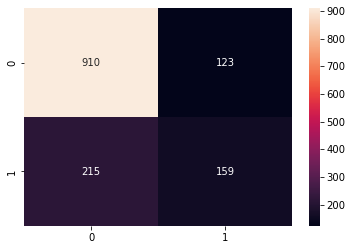

In [50]:
cm= confusion_matrix(y_test, y_pred)
sns.heatmap(cm,annot = True, fmt = "d")

In [51]:
# Import the matplot library
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree
# Initial feature_cols to store the independent feature's name
feature_cols = ['tenure', 'MonthlyCharges', 'TotalCharges']

# Plot a single tree from the Random Forest
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (30,30), dpi=800)
tree.plot_tree(forest.estimators_[0],
               feature_names = feature_cols, 
               class_names = True,
               filled = True);

### Question 4 

### Correlation Matrix

In order to find out strong correlation between the features and 'MonthlyCharges', correlation matrix is used so that during model development, the features that have weak correlation with 'MonthlyCharges' will be dropped.

In [53]:
df_num = {'gender': {'Female': 0, 'Male': 1},
         'SeniorCitizen': {'No': 0, 'Yes': 1},
         'Partner': {'No': 0, 'Yes': 1},
         'Dependents': {'No': 0, 'Yes': 1},
         'PhoneService': {'No': 0, 'Yes': 1},
         'MultipleLines': {'No': 0, 'Yes': 1},
         'InternetService': {'Fiber optic': 0, 'DSL': 1, 'No': 2},
         'OnlineSecurity': {'No': 0, 'Yes': 1},
          'OnlineBackup': {'No': 0, 'Yes': 1},
         'DeviceProtection': {'No': 0, 'Yes': 1},
         'TechSupport': {'No': 0, 'Yes': 1},
         'StreamingTV': {'No': 0, 'Yes': 1},
         'StreamingMovies': {'No': 0, 'Yes': 1},
         'Contract': {'Month-to-month': 0, 'One year': 1, 'Two year': 2},
         'PaperlessBilling': {'No': 0, 'Yes': 1},
         'PaymentMethod': {'Electronic check': 0, 'Mailed check': 1, 'Bank transfer (automatic)': 2, 'Credit card (automatic)': 3},
         'Churn': {'No': 0, 'Yes': 1}}
df = df.replace(df_num)

                    gender  SeniorCitizen   Partner  Dependents    tenure  \
gender            1.000000      -0.001819 -0.001379    0.010349  0.005285   
SeniorCitizen    -0.001819       1.000000  0.016957   -0.210550  0.015683   
Partner          -0.001379       0.016957  1.000000    0.452269  0.381912   
Dependents        0.010349      -0.210550  0.452269    1.000000  0.163386   
tenure            0.005285       0.015683  0.381912    0.163386  1.000000   
PhoneService     -0.007515       0.008392  0.018397   -0.001078  0.007877   
MultipleLines    -0.008883       0.142996  0.142561   -0.024307  0.332399   
InternetService   0.009643      -0.259030 -0.000938    0.177789 -0.031272   
OnlineSecurity   -0.016328      -0.038576  0.143346    0.080786  0.328297   
OnlineBackup     -0.013093       0.066663  0.141849    0.023639  0.361138   
DeviceProtection -0.000807       0.059514  0.153556    0.013900  0.361520   
TechSupport      -0.008507      -0.060577  0.120206    0.063053  0.325288   

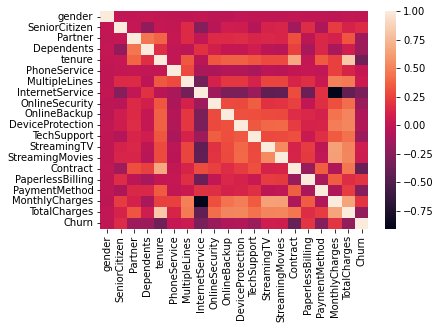

In [54]:
corrMat = df.corr()
sns.heatmap(corrMat, annot=False)
print(df.corr())
plt.show()

According to the correlation matrix and the heatmap, it shows that the the features that has strong correlation with MonthlyCharges are StreamingTV, StreamingMovies and TotalCharges with 0.63, 0.63 and 0.65 respectively. Therefore, the other features will be drop and the 3 chosen features will be used in model developing.

### Model Development

#### Defining X and y

Unnecessary features will be drop to improve training speed, interpretability and performance of the model.

In [55]:
X = df.drop(['customerID', 'gender', 'SeniorCitizen','Partner','Dependents','tenure','PhoneService','MultipleLines','InternetService','OnlineSecurity','OnlineBackup','DeviceProtection','TechSupport','Contract','PaperlessBilling','PaymentMethod','MonthlyCharges','Churn'], axis=1)
y = df['MonthlyCharges']
y=y.astype('int')

In [56]:
print(X)

      StreamingTV  StreamingMovies  TotalCharges
0               0                0         29.85
1               0                0       1889.50
2               0                0        108.15
3               0                0       1840.75
4               0                0        151.65
...           ...              ...           ...
7038            1                1       1990.50
7039            1                1       7362.90
7040            0                0        346.45
7041            0                0        306.60
7042            1                1       6844.50

[7032 rows x 3 columns]


#### Data splitting into training and testing data

Data will be split into 80% training and 20% testing

#### Random Forest Classifier Model Training

In [59]:
rf = RandomForestClassifier()
rf.fit(X_train, y_train)

RandomForestClassifier()

In [60]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state=42)

In [61]:
y_pred_rf = rf.predict(X_test)

[Text(510.9135247086325, 536.4473684210526, 'X[1] <= 0.5\ngini = 0.976\nsamples = 3514\nvalue = [16, 451, 431, 13, 1, 33, 153, 167, 28, 7, 43, 23\n6, 9, 27, 40, 8, 1, 7, 20, 46, 9, 6, 30, 82\n85, 17, 10, 29, 76, 103, 23, 4, 38, 97, 88, 29\n12, 29, 52, 50, 46, 16, 19, 58, 47, 34, 13, 24\n118, 118, 36, 23, 53, 135, 118, 50, 23, 61, 119\n123, 56, 31, 31, 106, 133, 64, 30, 59, 114, 101\n48, 32, 48, 116, 86, 44, 26, 62, 89, 109, 44, 21\n48, 75, 94, 43, 30, 30, 51, 36, 31, 13, 21, 29\n23, 12, 4, 2]'),
 Text(309.3864251370425, 522.1421052631579, 'X[0] <= 0.5\ngini = 0.953\nsamples = 2154\nvalue = [16, 451, 431, 13, 1, 33, 153, 167, 28, 7, 43, 23\n6, 8, 25, 33, 6, 1, 7, 19, 25, 6, 5, 21, 71\n77, 12, 7, 20, 63, 80, 14, 4, 30, 73, 65, 16\n6, 19, 39, 36, 34, 6, 3, 29, 28, 22, 11, 16\n96, 98, 17, 16, 35, 114, 85, 39, 20, 28, 70, 63\n31, 9, 15, 53, 59, 36, 18, 31, 44, 43, 16, 10\n7, 35, 18, 10, 4, 10, 12, 4, 2, 0, 2, 0, 0\n0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]'),
 Text(171.22210124411163, 507.8368

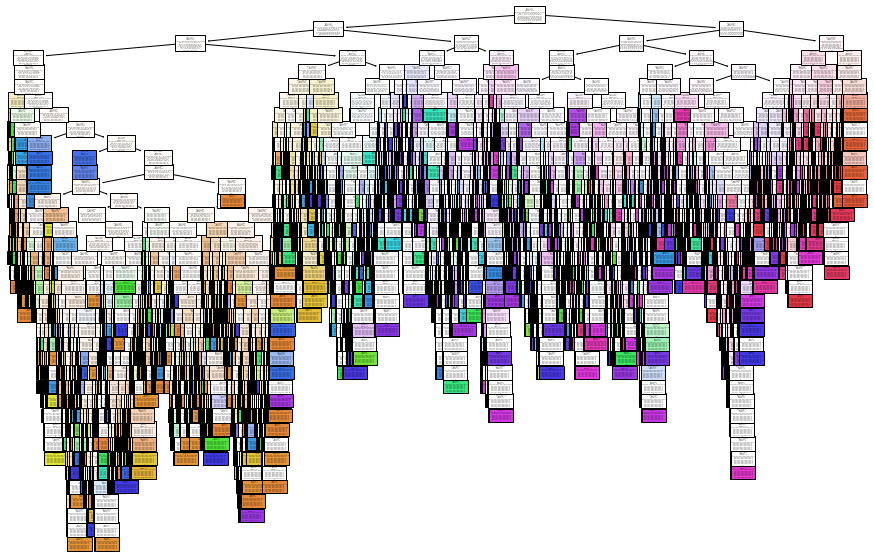

In [62]:
plt.figure(figsize=(15,10))
tree.plot_tree(rf.estimators_[0], filled=True)

### Model Evaluation

The model will be evaluated by 2 metrics: Confusion Matrix and Classification Report. It is to check for performance and accuracy of the model